# 1. Checking JWST and HST Images and the Photometric Catalog

In this tutorial, we will analyze real JWST NIRCam images. The images that we will analyze are the JWST ERO (Early Release Observations) data of SMACS 0723 (i.e., the first JWST images) that were released to the world on July 13, 2022. The NIRCam images consist of six filters: F090W, F150W, F200W, F277W, F356W, and F444W. In addition to this, we will also analyze Hubble Space Telescope (HST) images of the same field. 

Now, suppose that we already have catalogs of photometric SEDs (spectral energy distributions) and redshifts (i.e., the processes of sources detection and aperture photometry have been carried out) and now we will be selecting some interesting galaxies and do some basic analysis on them, such as making stamp image cutouts, plot the integrated SED, and some simple morphological analysis.  

These data sets are kindly provided by Gabriel Brammer on this link https://s3.amazonaws.com/grizli-v2/SMACS0723/Test/image_index.html and https://zenodo.org/record/6874301#.YvZFYOxBy3I. The data sets were processed using the [grizli](https://github.com/gbrammer/grizli) package. 

In [1]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

## 1.1. Checking JWST images

The NIRCam images consist of six filters: F090W, F150W, F200W, F277W, F356W, and F444W. These processed data have different pixel sizes, which we will deal in our current analysis. The short wavelength channel (F090W, F150W, and F200W) have pixel size of 0.02 arcsec/pixel, while the long wavelength channel (F277W, F356W, and F444W) have pixel size of 0.04 arcsec/pixel. This makes the different in image dimension, as we see below.

In [3]:
filters_jwst = ['jwst_nircam_f090w', 'jwst_nircam_f150w', 'jwst_nircam_f200w', 
                'jwst_nircam_f277w', 'jwst_nircam_f356w', 'jwst_nircam_f444w']
nbands_jwst = len(filters_jwst)

jwst_img = []
jwst_img.append("smacs0723-f090w_drz_sci.fits")
jwst_img.append("smacs0723-f150w_drz_sci.fits")
jwst_img.append("smacs0723-f200w_drz_sci.fits")
jwst_img.append("smacs0723-f277w_drz_sci.fits")
jwst_img.append("smacs0723-f356w_drz_sci.fits")
jwst_img.append("smacs0723-f444w_drz_sci.fits")

data_dir = 'data/'

In [3]:
## Check the image size from the FITS info
for i in range(0,nbands_jwst):
    hdu = fits.open(data_dir+jwst_img[i])
    hdu.info()
    hdu.close()

Filename: data/smacs0723-f090w_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    2154   (18000, 16000)   float32   
  1  HDRTAB        1 BinTableHDU    559   72R x 275C   [D, 3A, K, D, D, D, D, D, D, D, D, D, D, D, D, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, D, D, D, D, D, D, D, D, D, D, D, 11A, 5A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 12A, 12A, D, D, D, D, 23A, 10A, D, D, D, 2A, D, D, D, D, D, D, D, D, D, 1A, D, D, D, D, 40A, D, D, 5A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 4A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K, D, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 5A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 26A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 7A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, L,

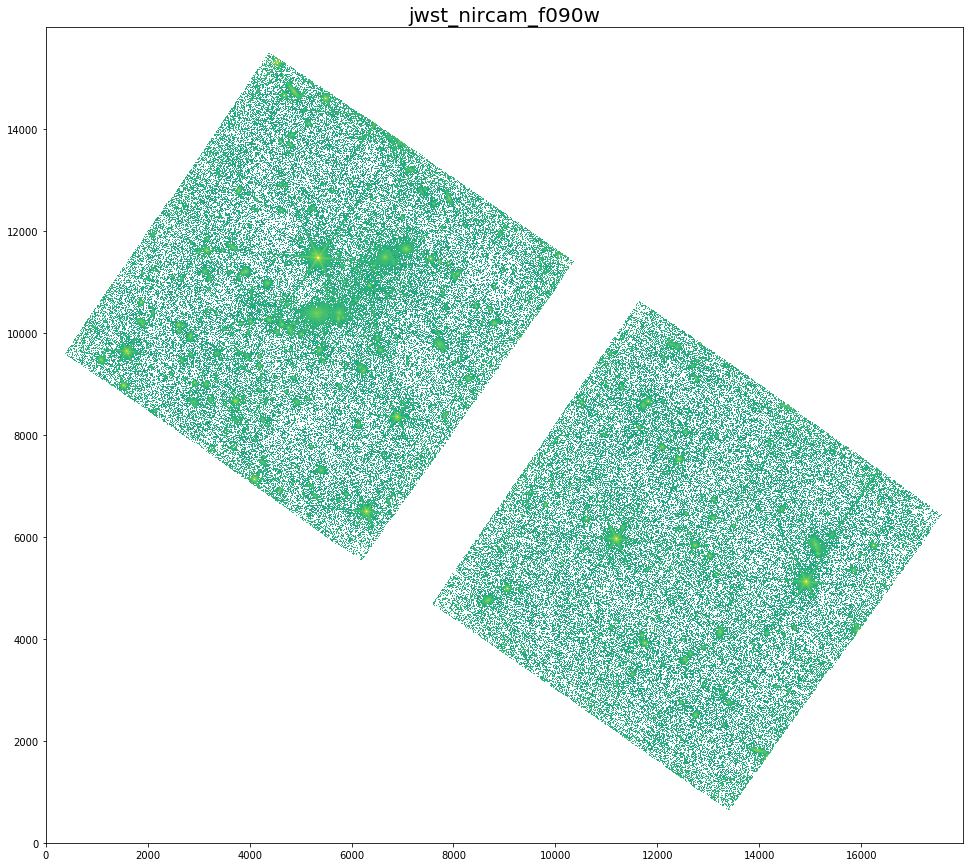

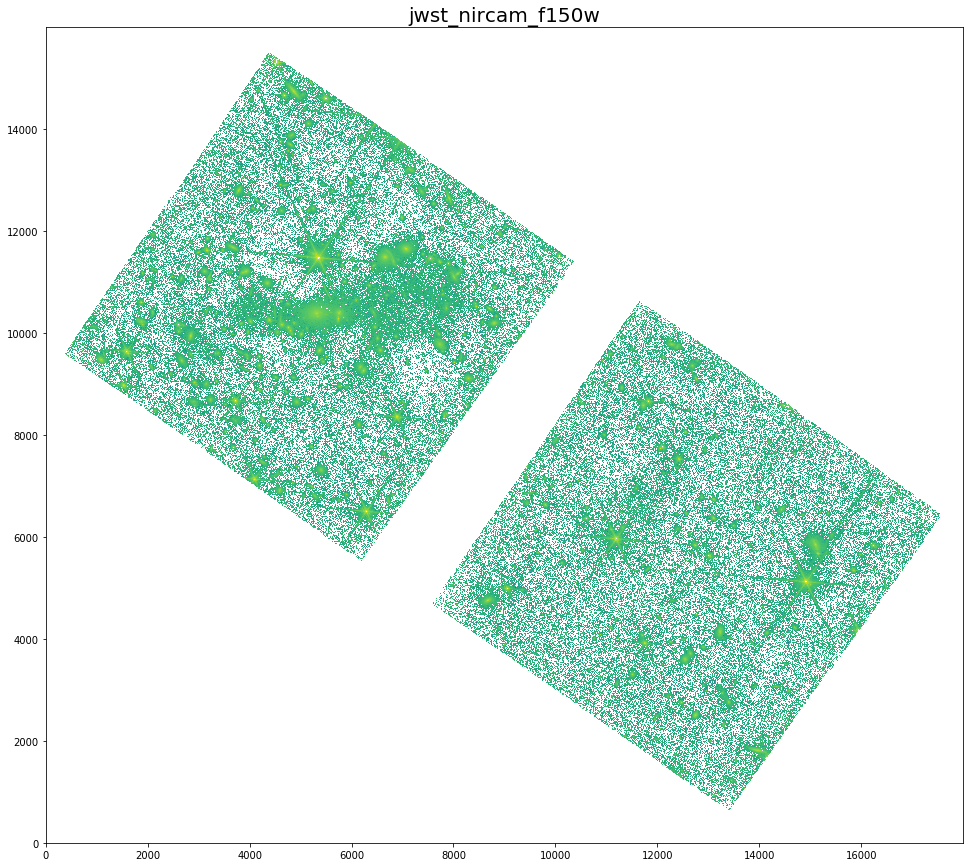

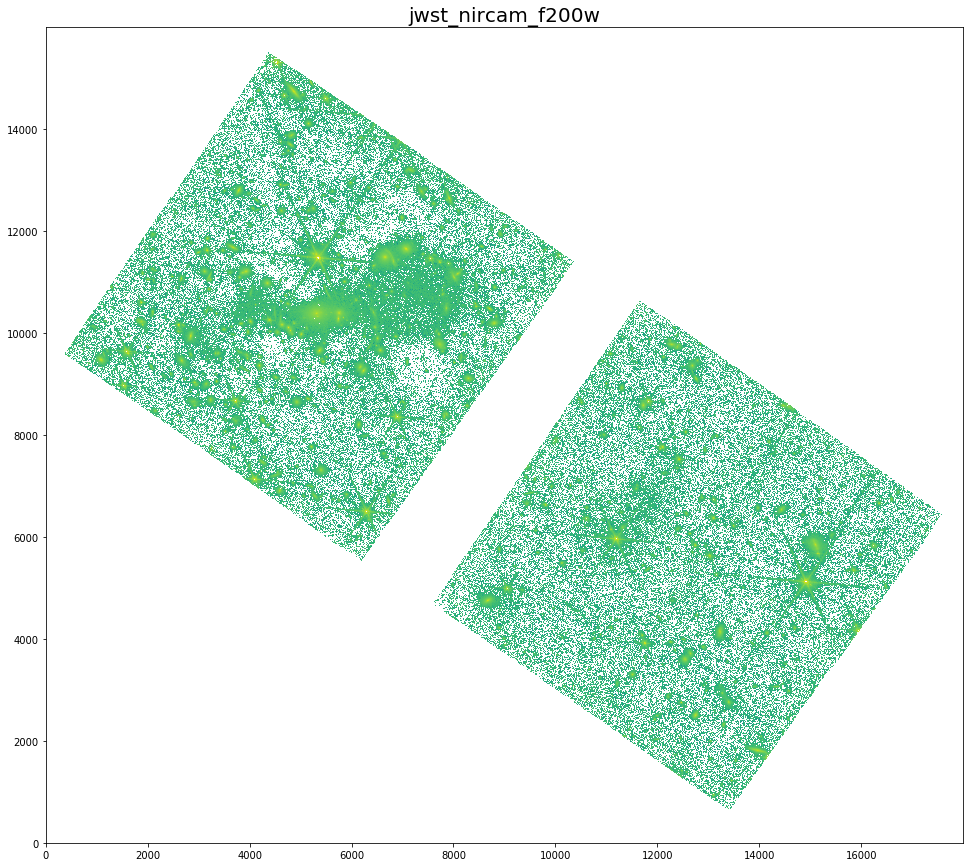

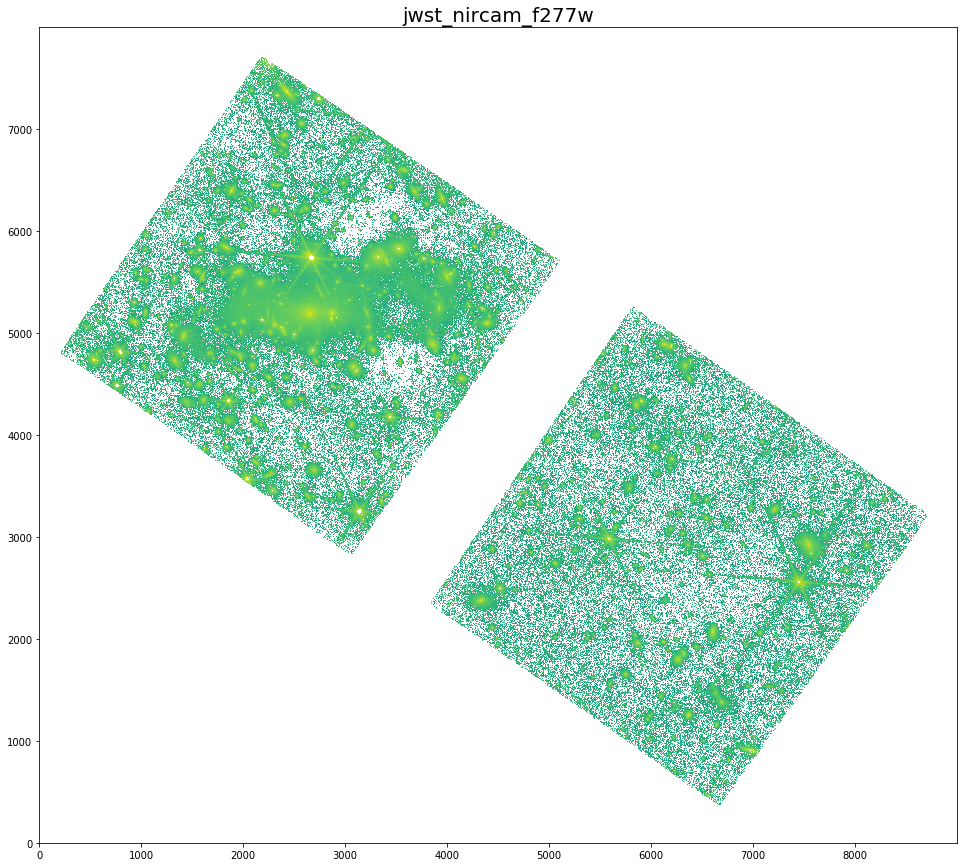

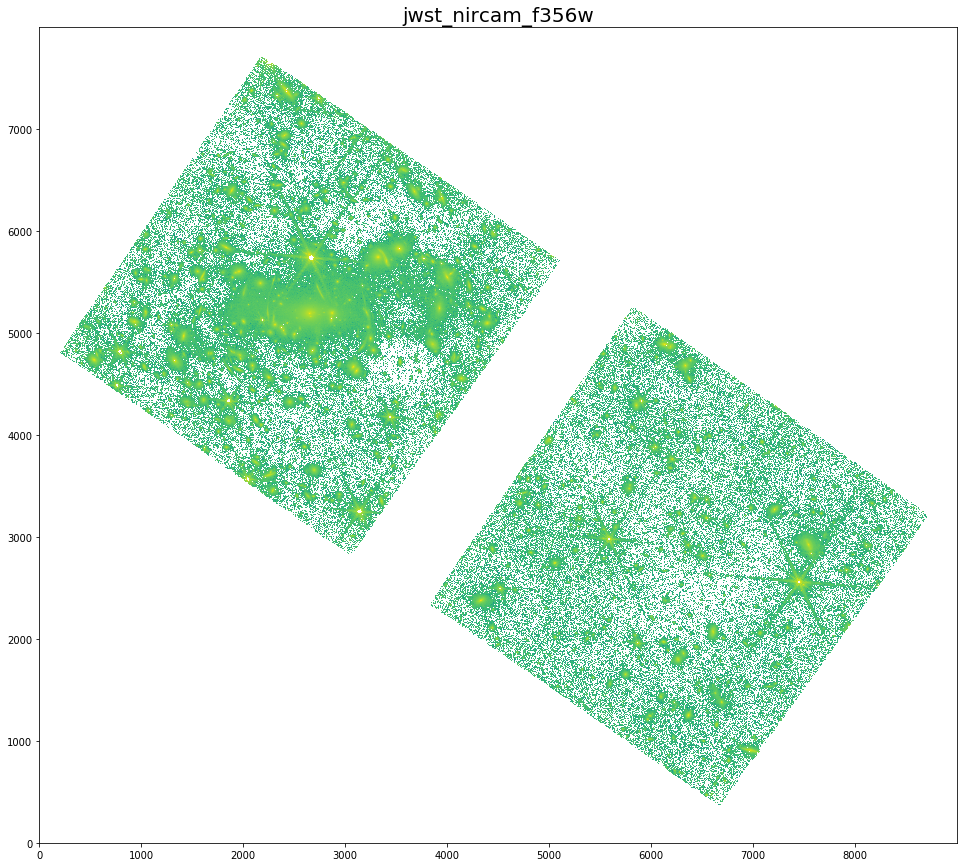

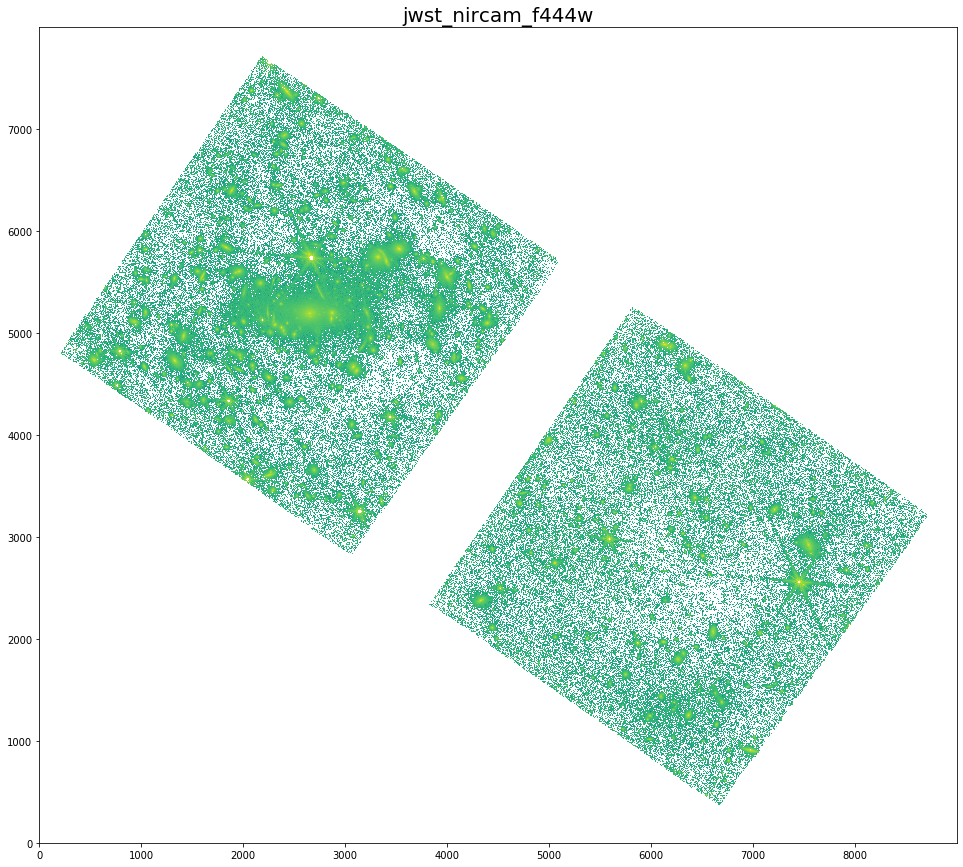

In [4]:
for i in range(0,nbands_jwst):
    hdu = fits.open(data_dir+jwst_img[i])
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(18,15))
    f1 = plt.subplot()
    plt.title('%s' % filters_jwst[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

## 1.2. Checking HST images

The processed HST images have the same dimension and pixel size as that of the long wavelength channel of JWST, which is 0.04 arcsec/pixel. We will check the image sizes below. The HST images of SMACS 0723 cluster are taken from the [RELICS](https://relics.stsci.edu/) survey (PI: Dan Coe)

In [6]:
filters_hst = ['hst_acs_f435w', 'hst_acs_f606w', 'hst_acs_f814w', 'hst_wfc3_ir_f105w', 
               'hst_wfc3_ir_f125w', 'hst_wfc3_ir_f140w', 'hst_wfc3_ir_f160w']
nbands_hst = len(filters_hst)

hst_img = []
hst_img.append("smacs0723-f435w_drc_sci.fits")
hst_img.append("smacs0723-f606w_drc_sci.fits")
hst_img.append("smacs0723-f814w_drc_sci.fits")
hst_img.append("smacs0723-f105w_drz_sci.fits")
hst_img.append("smacs0723-f125w_drz_sci.fits")
hst_img.append("smacs0723-f140w_drz_sci.fits")
hst_img.append("smacs0723-f160w_drz_sci.fits")

In [7]:
## Check the image size from the FITS info
for i in range(0,nbands_hst):
    hdu = fits.open(data_dir+hst_img[i])
    hdu.info()
    hdu.close()

Filename: data/smacs0723-f435w_drc_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      47   (9000, 8000)   float32   
Filename: data/smacs0723-f606w_drc_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      48   (9000, 8000)   float32   
Filename: data/smacs0723-f814w_drc_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      48   (9000, 8000)   float32   
Filename: data/smacs0723-f105w_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      63   (9000, 8000)   float32   
Filename: data/smacs0723-f125w_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      51   (9000, 8000)   float32   
Filename: data/smacs0723-f140w_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 Pri

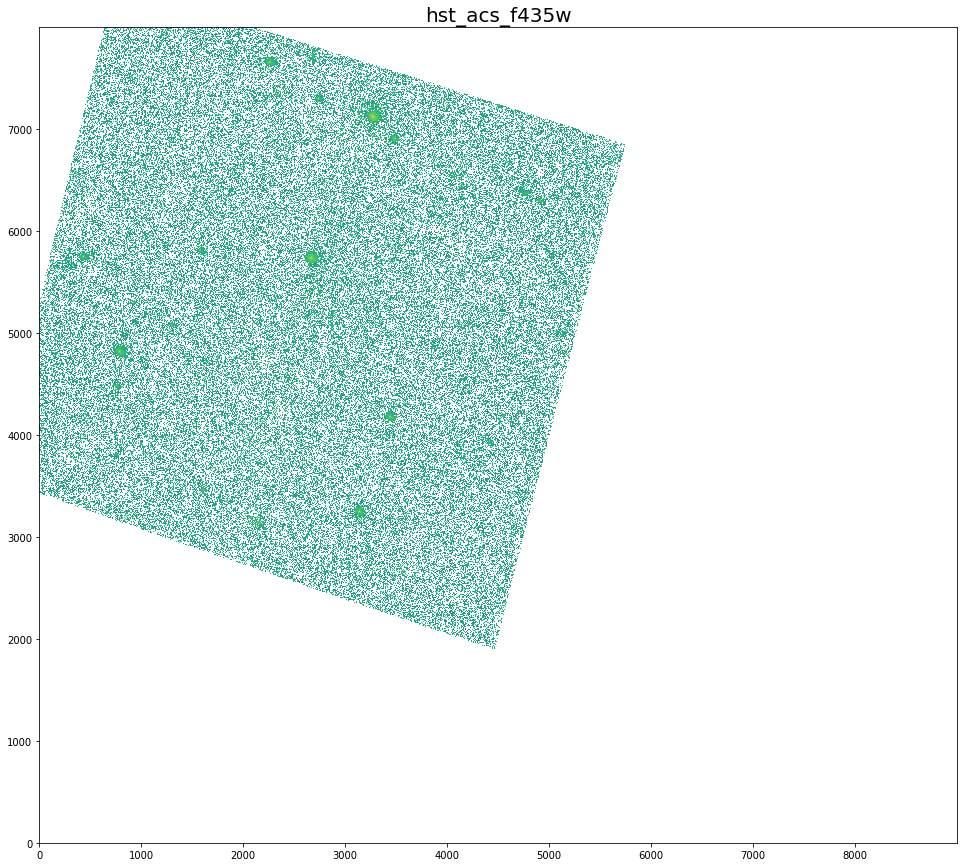

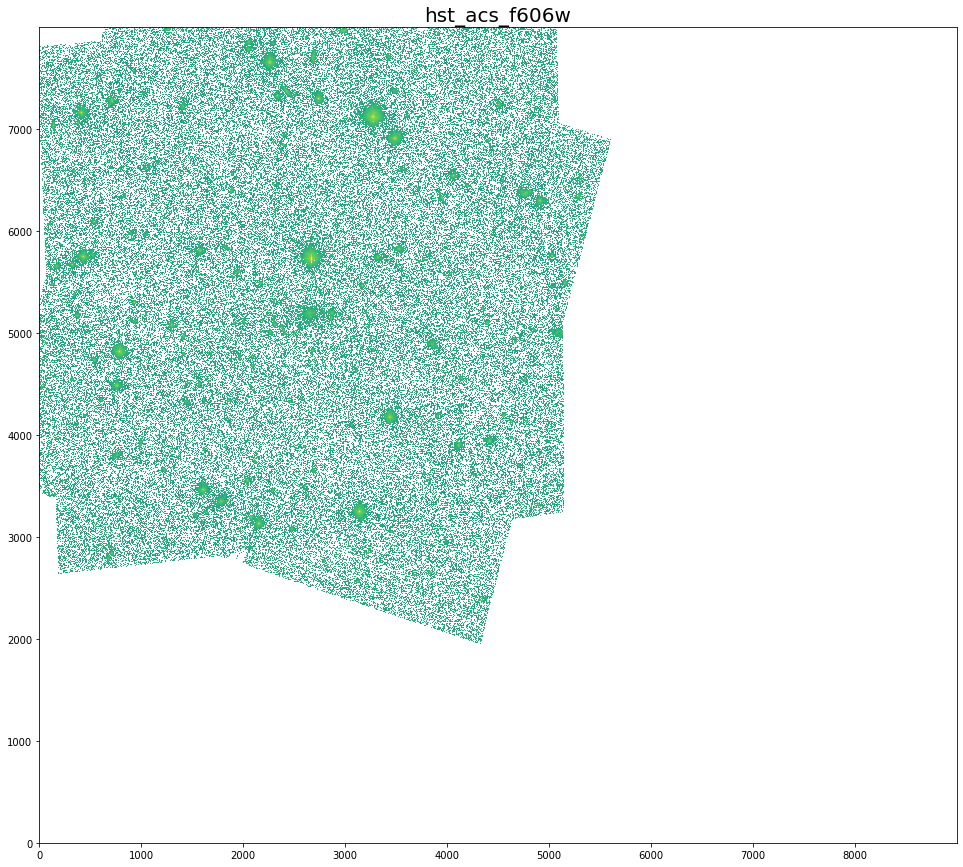

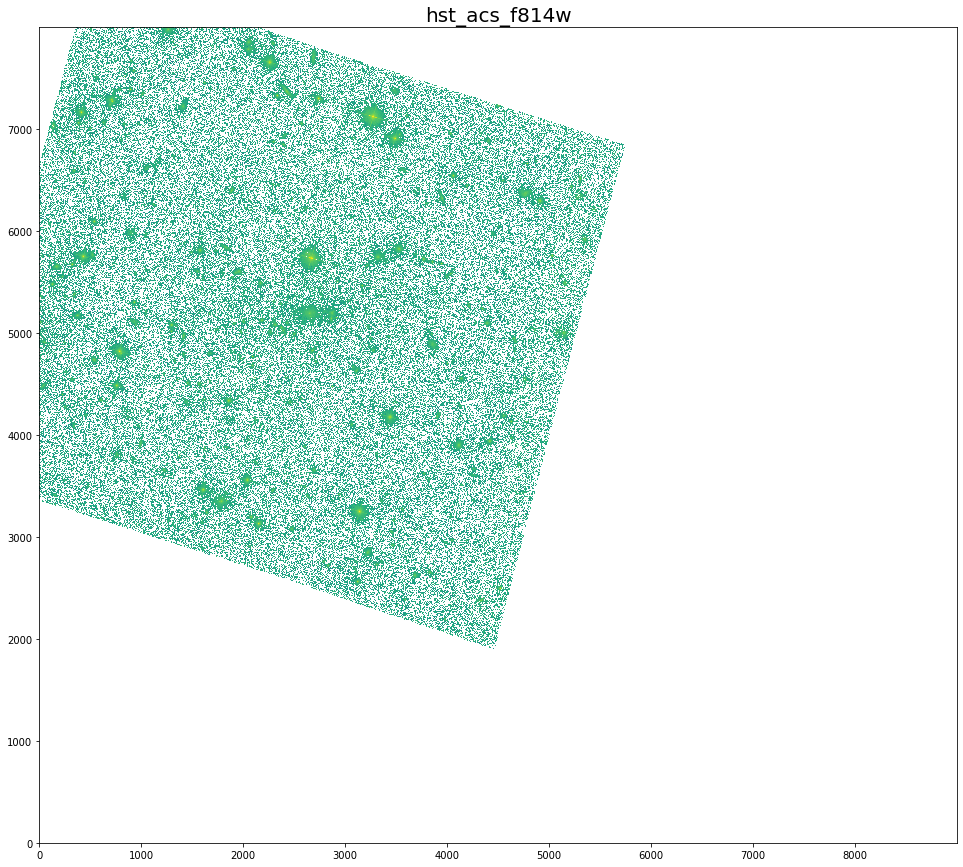

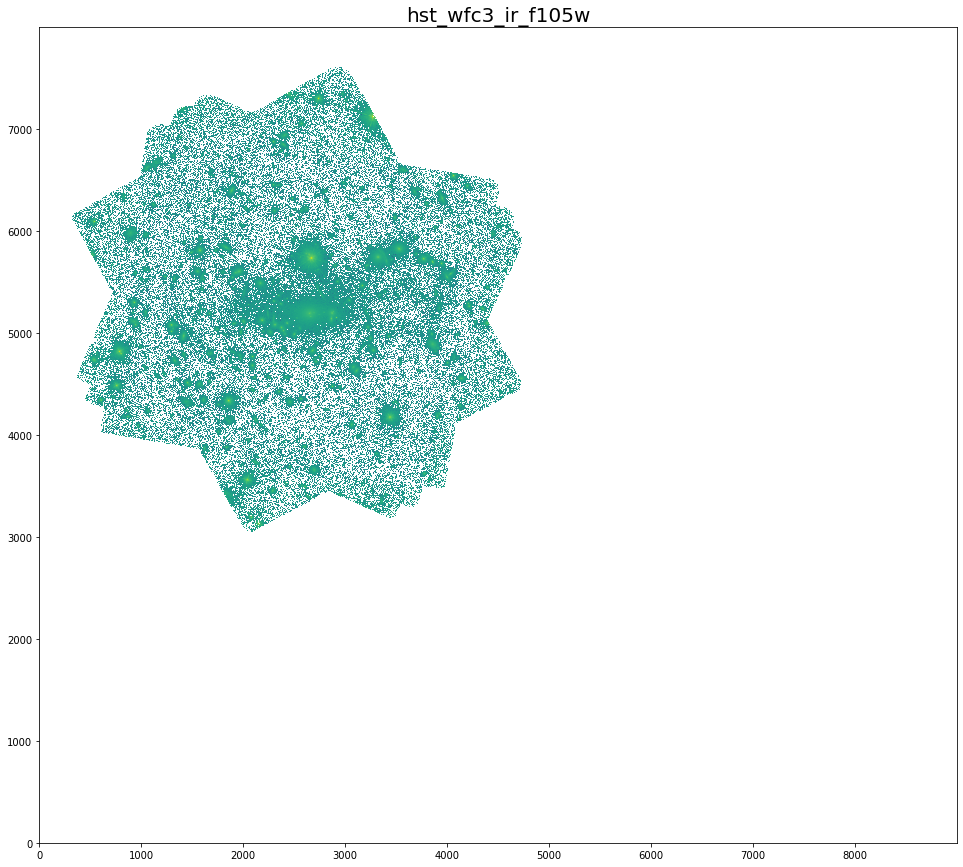

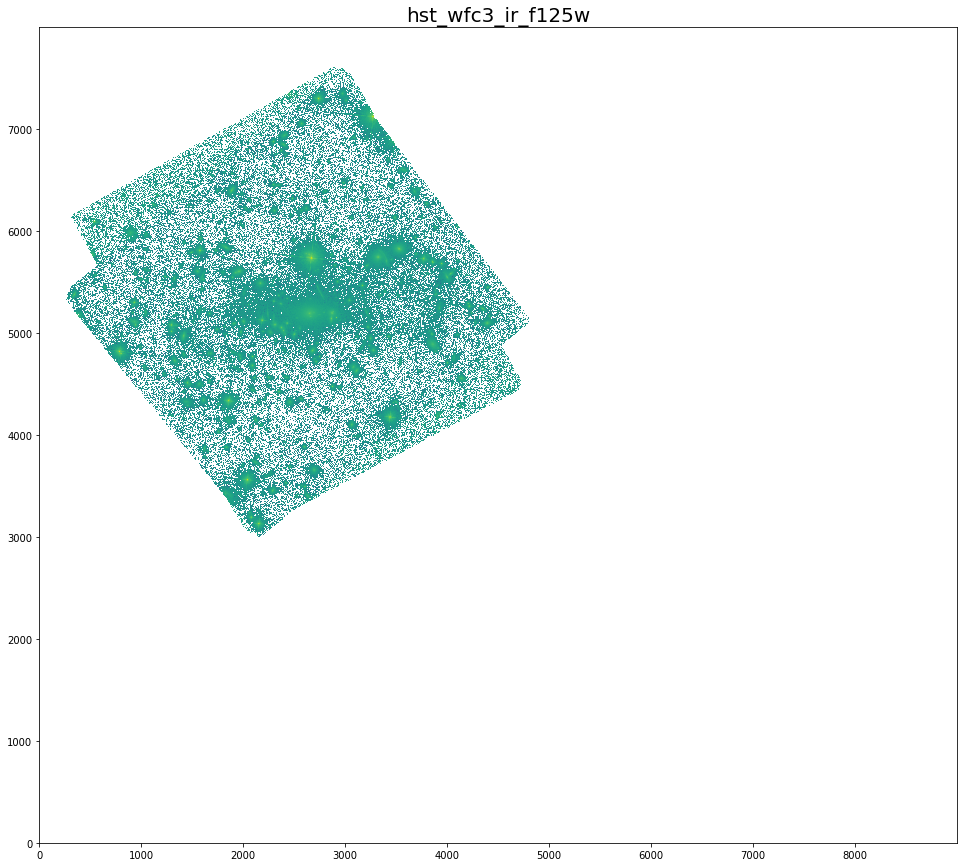

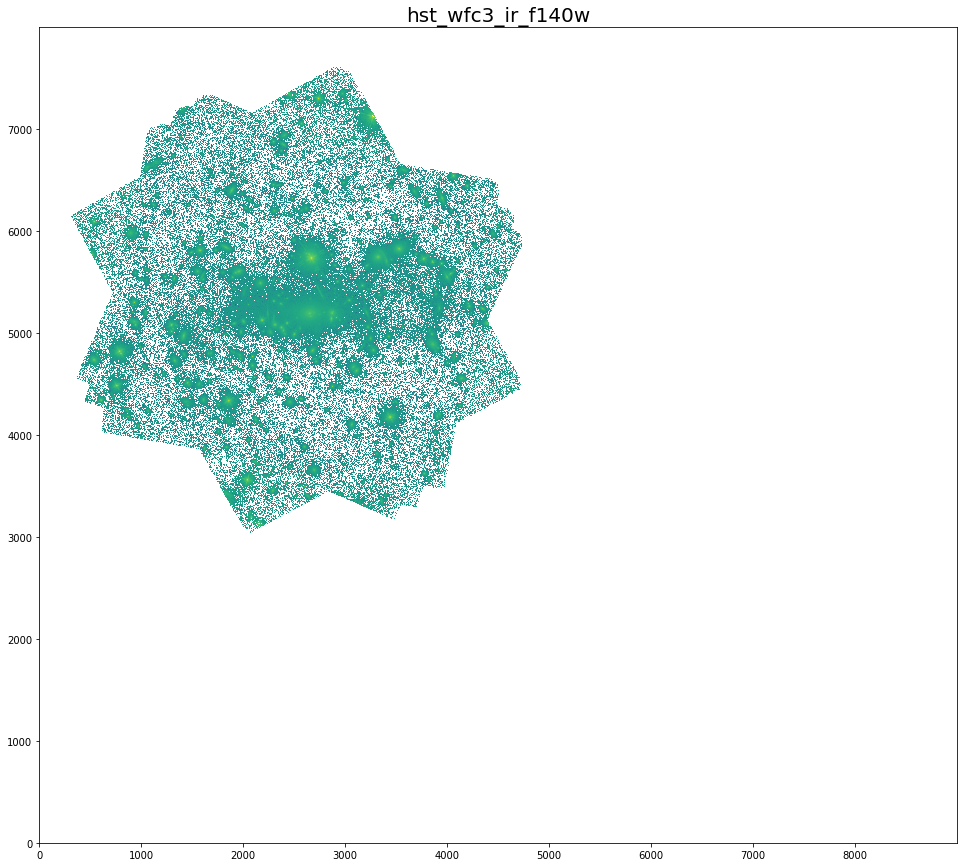

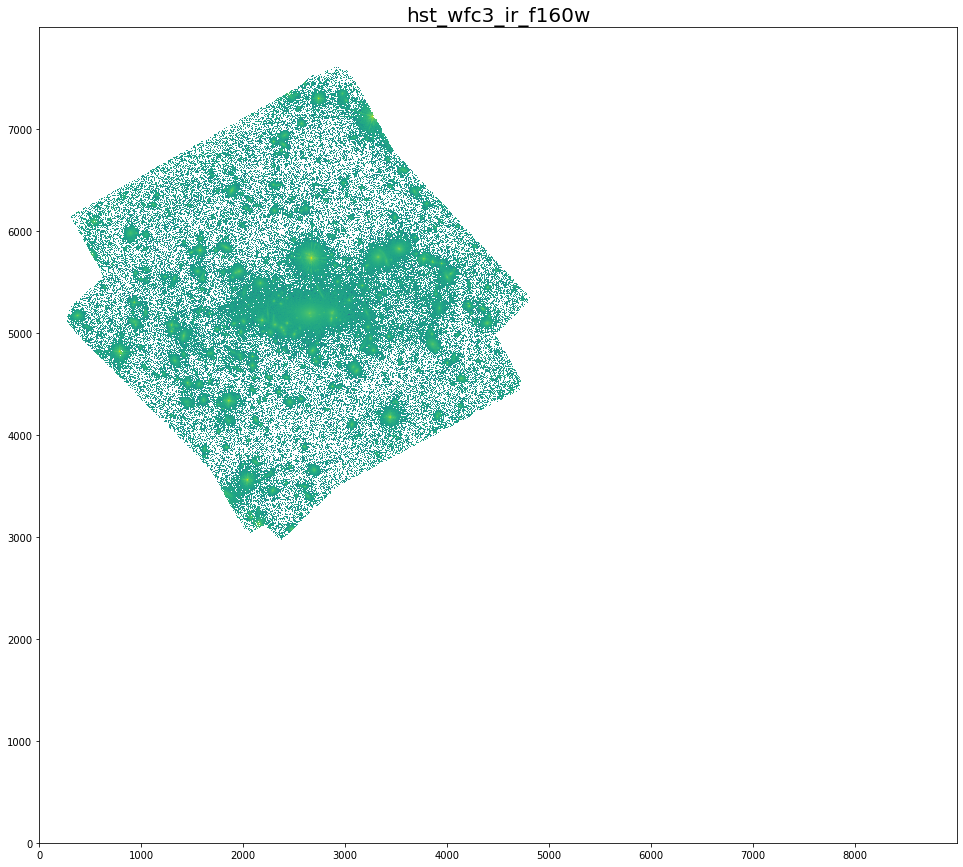

In [8]:
for i in range(0,nbands_hst):
    hdu = fits.open(data_dir+hst_img[i])
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(18,15))
    f1 = plt.subplot()
    plt.title('%s' % filters_hst[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

## 1.3. Checking photometric redshift catalogs

The photometric redshifts were measured using EAZY software. The catalog is stored in a FITS file format. Here, we learn how to read and extract information from FITS binary table.

In [11]:
# get photometric redshift catalogs
hdu = fits.open(data_dir+"smacs0723.eazypy.zout.fits")
hdu.info()
pz_cat = hdu[1].data
print (hdu[1].header)
hdu.close()

Filename: data/smacs0723.eazypy.zout.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    266   7585R x 45C   [J, D, D, D, K, E, E, E, D, D, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, D, D, D, D, D, D, D, D, D, 5D, 5D, 5D, 5D, 5D, 5D]   
XTENSION= 'BINTABLE'           / binary table extension                         BITPIX  =                    8 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  456 / length of dimension 1                          NAXIS2  =                 7585 / length of dimension 2                          PCOUNT  =                    0 / number of group parameters                     GCOUNT  =                    1 / number of groups                               TFIELDS =                   45 / number of table fields                         TTYP

In [12]:
# get some important information from the catalog
z_phot = pz_cat['z_phot']
z_phot_chi2 = pz_cat['z_phot_chi2']
log_mass = np.log10(pz_cat['mass'])
log_sfr = np.log10(pz_cat['sfr'])

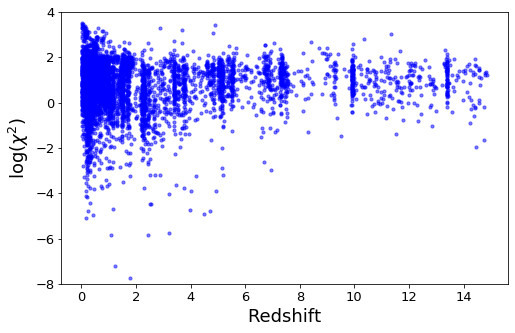

In [21]:
fig1 = plt.figure(figsize=(8,5))
f1 = plt.subplot()
plt.xlabel("Redshift", fontsize=18)
plt.ylabel(r"$\log(\chi^{2})$", fontsize=18)
plt.setp(f1.get_yticklabels(), fontsize=13)
plt.setp(f1.get_xticklabels(), fontsize=13)
plt.ylim(-8.0,4.0)

plt.scatter(z_phot, np.log10(z_phot_chi2), s=10, marker='o', color='blue', alpha=0.5)

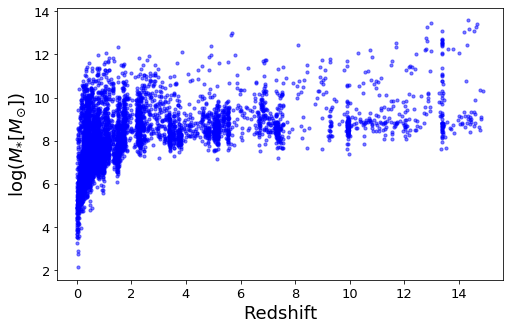

In [22]:
fig1 = plt.figure(figsize=(8,5))
f1 = plt.subplot()
plt.xlabel("Redshift", fontsize=18)
plt.ylabel(r"$\log(M_{*}[M_{\odot}])$", fontsize=18)
plt.setp(f1.get_yticklabels(), fontsize=13)
plt.setp(f1.get_xticklabels(), fontsize=13)

plt.scatter(z_phot, log_mass, s=10, marker='o', color='blue', alpha=0.5)

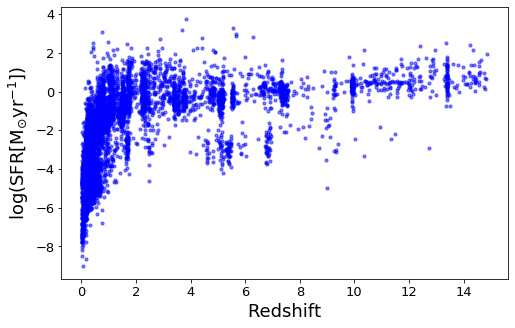

In [23]:
fig1 = plt.figure(figsize=(8,5))
f1 = plt.subplot()
plt.xlabel("Redshift", fontsize=18)
plt.ylabel(r"$\log(\rm{SFR}[M_{\odot}\rm{yr}^{-1}])$", fontsize=18)
plt.setp(f1.get_yticklabels(), fontsize=13)
plt.setp(f1.get_xticklabels(), fontsize=13)

plt.scatter(z_phot, log_sfr, s=10, marker='o', color='blue', alpha=0.5)

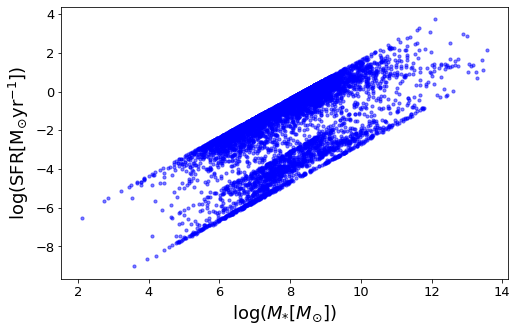

In [24]:
fig1 = plt.figure(figsize=(8,5))
f1 = plt.subplot()
plt.xlabel(r"$\log(M_{*}[M_{\odot}])$", fontsize=18)
plt.ylabel(r"$\log(\rm{SFR}[M_{\odot}\rm{yr}^{-1}])$", fontsize=18)
plt.setp(f1.get_yticklabels(), fontsize=13)
plt.setp(f1.get_xticklabels(), fontsize=13)

plt.scatter(log_mass, log_sfr, s=10, marker='o', color='blue', alpha=0.5)

## 1.4. Checking photometric catalog

Here, we will retrieve valuable information from photometric catalog that is in a FITS file format.

In [4]:
hdu = fits.open(data_dir+'smacs0723_phot_apcorr.fits')
hdu.info()
photo_cat = hdu[1].data

Filename: data/smacs0723_phot_apcorr.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU   2906   7585R x 786C   [J, D, K, K, K, K, K, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K, K, K, K, D, D, J, D, D, D, D, D, D, K, D, D, D, D, D, D, K, D, I, D, D, D, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D, D, D, D, I, D

### Let's retrieve corrected integrated fluxes in HST and JWST filters from the catalog

The flux densities are in units of micro Jansky.

In [46]:
# the column keywords that we need

flux_keys = ['f435w_flux_aper_3', 'f606w_flux_aper_3', 'f814w_flux_aper_3', 'f105w_flux_aper_3', 
            'f125w_flux_aper_3', 'f140w_flux_aper_3', 'f160w_flux_aper_3', 
            'f090w_flux_aper_3', 'f150w_flux_aper_3', 'f200w_flux_aper_3', 'f277w_flux_aper_3',
            'f356w_flux_aper_3', 'f444w_flux_aper_3']

fluxerr_keys = ['f435w_fluxerr_aper_3', 'f606w_fluxerr_aper_3', 'f814w_fluxerr_aper_3', 'f105w_fluxerr_aper_3', 
            'f125w_fluxerr_aper_3', 'f140w_fluxerr_aper_3', 'f160w_fluxerr_aper_3', 
            'f090w_fluxerr_aper_3', 'f150w_fluxerr_aper_3', 'f200w_fluxerr_aper_3', 'f277w_fluxerr_aper_3',
            'f356w_fluxerr_aper_3', 'f444w_fluxerr_aper_3']

## 1.5. Select sample galaxies

Here, we will try to select galaxies of interest. In this example, we will select galaxies that meet the following criteria

* located at redshift range of 1.0 < z < 5.0
* More massive than 10^9 solar mass
* Have reliable redshift measurement with chi-square less than 40
* Observed by both JWST and HST

Then, we will retrieve their properties and spectral energy distributions.

In [92]:
idx_sel = np.where((z_phot>1.0) & (z_phot<5.0) & (log_mass>9.0) & (z_phot_chi2<40.0) & (photo_cat['f105w_flux_aper_3']>0) & (photo_cat['f125w_flux_aper_3']>0) & (z_phot_chi2>1e-4))
ngals = len(idx_sel[0])
print ('Number of selected galaxies: %d' % ngals)

Number of selected galaxies: 34


In [93]:
from astropy.table import QTable

data_table = []
names = []

names.append('ID')
data_table.append(idx_sel[0]+1)

names.append('ra')
data_table.append(pz_cat['ra'][idx_sel[0]])

names.append('dec')
data_table.append(pz_cat['dec'][idx_sel[0]])

names.append('photo-z')
data_table.append(z_phot[idx_sel[0]])

names.append('z_chi2')
data_table.append(z_phot_chi2[idx_sel[0]])

names.append('log_mass')
data_table.append(log_mass[idx_sel[0]])

names.append('log_sfr')
data_table.append(log_sfr[idx_sel[0]])

name_fil = ['f435w', 'f606w', 'f814w', 'f105w', 'f125w', 'f140w', 'f160w', 'f090w', 'f150w', 'f200w', 'f277w',
            'f356w', 'f444w']

for bb in range(0,len(name_fil)):
    names.append('%s_f' % name_fil[bb])
    data_table.append(photo_cat[flux_keys[bb]][idx_sel[0]])
    
    names.append('%s_ferr' % name_fil[bb])
    data_table.append(photo_cat[fluxerr_keys[bb]][idx_sel[0]])
    
names = tuple(names)
t = QTable(data_table, names=names, meta={'name':'catalog'})

In [94]:
t

ID,ra,dec,photo-z,z_chi2,log_mass,log_sfr,f435w_f,f435w_ferr,f606w_f,f606w_ferr,f814w_f,f814w_ferr,f105w_f,f105w_ferr,f125w_f,f125w_ferr,f140w_f,f140w_ferr,f160w_f,f160w_ferr,f090w_f,f090w_ferr,f150w_f,f150w_ferr,f200w_f,f200w_ferr,f277w_f,f277w_ferr,f356w_f,f356w_ferr,f444w_f,f444w_ferr
int64,float64,float64,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
3169,110.8361228774515,-73.4734810999784,1.725147,21.945118,9.288838470695602,0.37055451886076574,0.005082838021371527,0.024102313365089566,0.072118214766857,0.014371279783274307,0.10393879418622887,0.02314110992794713,0.23305413182112553,0.31677282640772025,0.34659120546336836,0.02126290006096971,0.2955749973852648,0.6435672893053856,0.4016353044167403,0.022049348486586552,0.15888196179689956,0.005595293009477088,0.29645564339381325,0.00550285885724744,0.29449893991012166,0.005124174027721714,0.28142618017933974,0.4990484221087037,0.25016029559195,0.010622603840288975,0.19592578510608633,0.01446164805395053
3766,110.80938901120633,-73.46927500247159,4.764053,19.060183,9.229033506686196,0.32891616388317546,0.03357316533276807,0.022523881616342754,0.035901734520421,0.013783346357432794,0.01758966942078883,0.022825287559959342,0.06256666209018161,0.015779187799557455,0.059786575969672795,0.017979564607590013,0.050762289379271186,0.014053177143725204,0.027904025244273992,0.18254525296593385,0.05992869635672403,0.004146736985013213,0.047587004593983864,0.004191341247561975,0.06076469787449429,0.0038558885261409915,0.09998989498111822,0.008046783936136883,0.12784892574046747,0.007268928142415327,0.09890739947010758,0.009613142229332967
3802,110.86993786408046,-73.46910779188276,3.3289807,30.003904,9.772604241598904,0.3449266002459599,-0.04519671974851162,0.02334119566308672,0.05609133720714061,0.013854041028993822,0.13294680116815683,0.03558764390560107,0.084577072322442,0.026025347106628637,0.13270278639476096,0.022670941879696156,0.1569669329824937,0.02382184402891404,0.23633794178721768,0.025174694335477706,0.07304476939747075,0.2116100887783821,0.21269170569625157,0.5139707145157864,0.35660859629757347,2.2523591043674043,0.4817819753838714,0.03311907171271265,0.45289769608164093,0.039015625365213004,0.43140658630121786,0.0371972620254221
4092,110.81732322382764,-73.46727353402237,3.3822863,37.83476,9.211870352215358,0.020939101222030507,-0.0538035991215758,0.023272382555484524,0.08538353969050302,0.01667675957791264,0.04161200387943328,0.02187955212727851,0.026668416172888666,0.015505256610595477,0.05549014411473726,0.020260453073099472,0.06306458910889644,0.013869101584917961,0.0708333358180722,0.01922641974095282,0.040470830300644425,0.0037770564129188705,0.07051769087773274,0.003968754020202441,0.13859502878035046,0.0036894398242587802,0.1377945431131923,0.007202229095510976,0.13066075943535846,0.00692102622900068,0.11810263501009582,0.009530941172061831
4113,110.8320139836775,-73.46735514489716,1.4436643,38.725998,9.337130748153225,-0.42425895535555735,-0.041666402832907734,0.023054198217713633,0.08649575858105045,0.015220110729873854,0.11242887066789964,0.023207125228459382,0.2741471618747174,0.01584330511201999,0.31555001354363016,0.01811849434610614,0.3685216724411369,0.014557922709479646,0.4340392323261979,0.020871003845829607,0.21053455855416434,0.003978176127840854,0.4377197326099226,0.004401174373252102,0.48527006594328065,0.004162030411559958,0.6013733218275292,0.008204470308769335,0.5774909332313606,0.00811152848223372,0.5086450607857489,0.010236474269972495
4380,110.80645520585126,-73.4651878514494,4.6534147,37.371567,9.156758685281105,0.7897879189078829,-0.05429891138273819,0.023182401788352753,0.010104014980312893,0.01571135707741363,0.1648516844549481,0.022463648388073455,0.09649880368048588,0.015536566136639594,0.10062139328719508,0.018091569136466236,0.1054296535552871

In [95]:
## store the coordinates to text file
file_out = open('sample.txt','w')
file_out.write("# id ra dec\n")
for ii in range(0,ngals):
    file_out.write('%d  %lf  %lf\n' % (idx_sel[0][ii]+1,pz_cat['ra'][idx_sel[0]][ii],pz_cat['dec'][idx_sel[0]][ii]))
file_out.close()


## 1.6. look at the galaxies and their SEDs

In this step, we will look at the cutout F200W images of the selected galaxies and also see the SEDs of those galaxies.

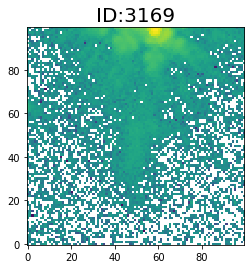

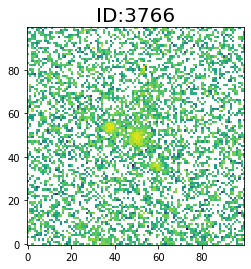

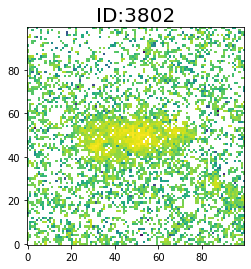

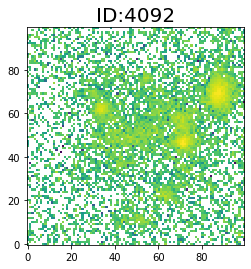

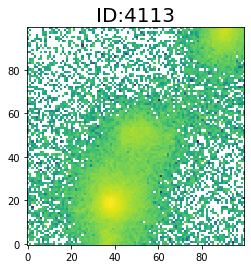

...

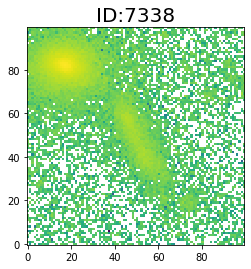

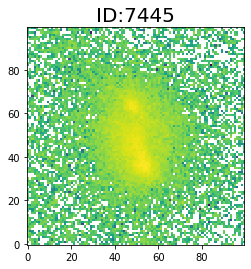

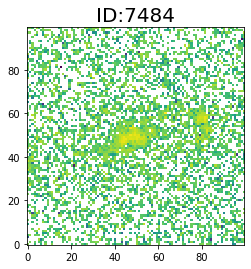

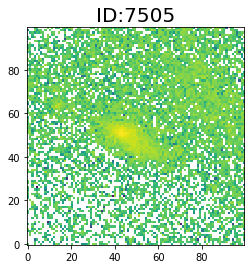

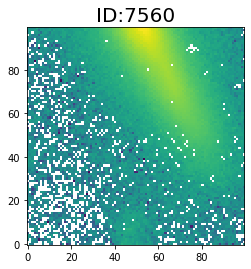

In [96]:
from astropy.wcs import WCS

hdu = fits.open(data_dir+'smacs0723-f200w_drz_sci.fits')
data_img = hdu[0].data
wcs = WCS(hdu[0].header)
hdu.close()

dim_y, dim_x = data_img.shape[0], data_img.shape[1]

for ii in range(0,ngals):
    x_cent, y_cent = wcs.wcs_world2pix(pz_cat['ra'][idx_sel[0]][ii], pz_cat['dec'][idx_sel[0]][ii], 1)
    
    xmin, xmax = int(x_cent)-50, int(x_cent)+50
    ymin, ymax = int(y_cent)-50, int(y_cent)+50
    if xmin<0:
        xmin = 0
    if xmax>dim_x:
        xmax = dim_x
    if ymin<0:
        ymin = 0
    if ymax>dim_y:
        ymax = dim_y
        
    data_img_crop = data_img[ymin:ymax, xmin:xmax]
    
    fig = plt.figure(figsize=(4,4))
    f1 = plt.subplot()
    plt.title("ID:%d" % (idx_sel[0][ii]+1), fontsize=20)
    plt.imshow(np.log10(data_img_crop), origin='lower')

### Plotting SEDs of the galaxies

In [97]:
name_fil_sort = ['f435w', 'f606w', 'f814w', 'f090w', 'f105w', 'f125w', 'f140w', 'f150w', 
                 'f160w', 'f200w', 'f277w', 'f356w', 'f444w']
photo_wave = [4317.9, 5919.4, 8059.9, 9020.0, 10530.87, 12495.71, 13976.13, 15010.0, 
              15433.07, 19890.0, 27620.0, 35680.0, 44080.0]
nbands = len(name_fil_sort)

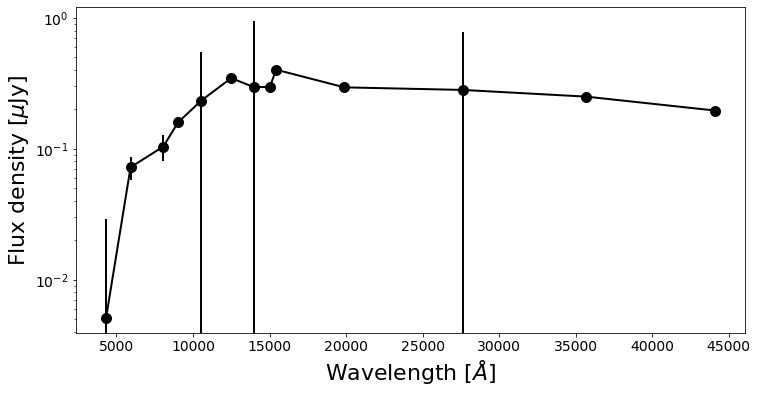

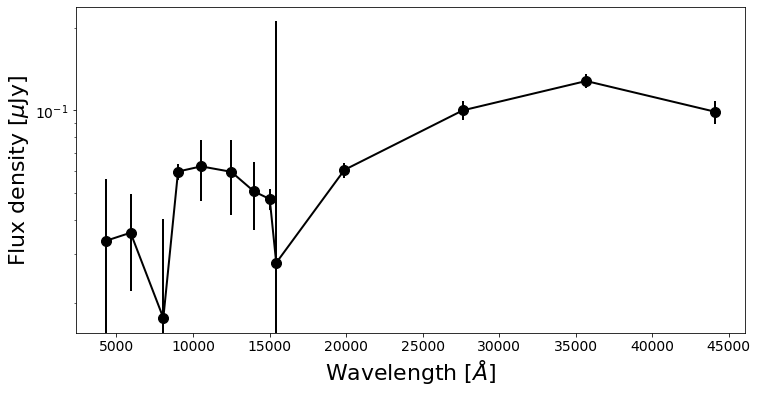

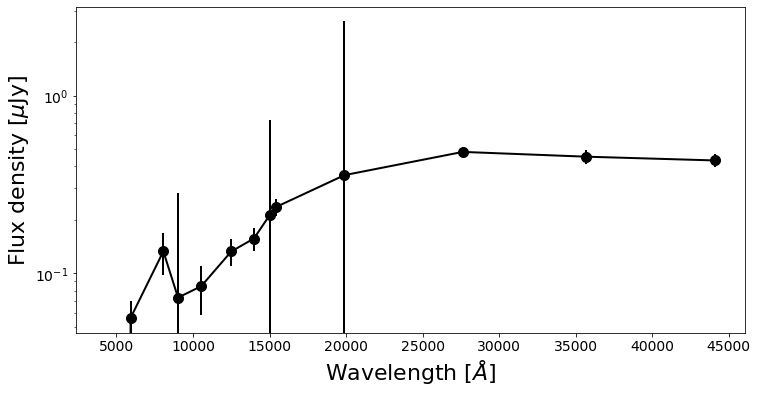

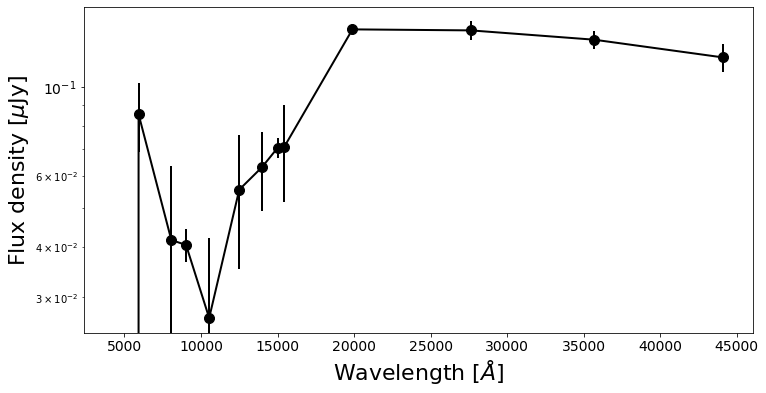

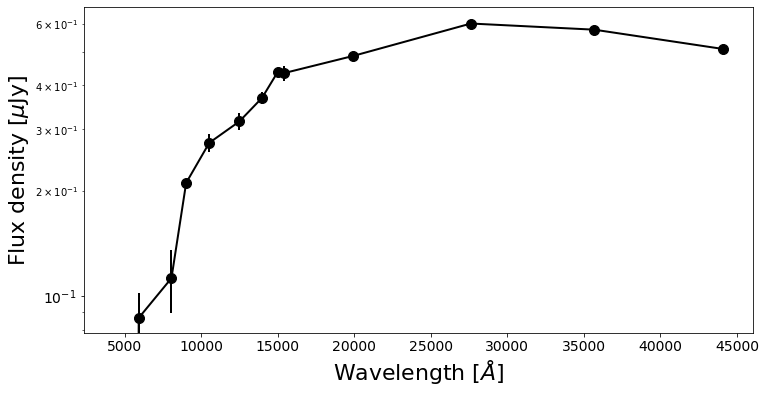

...

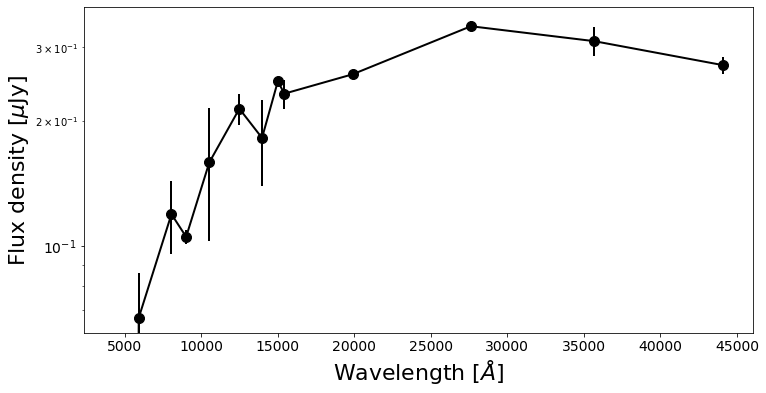

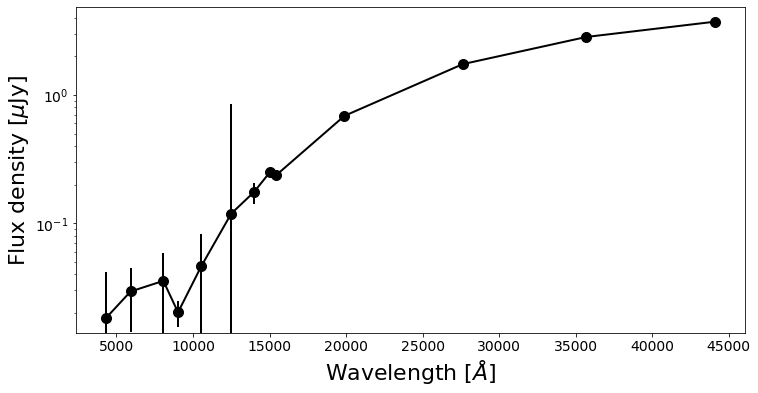

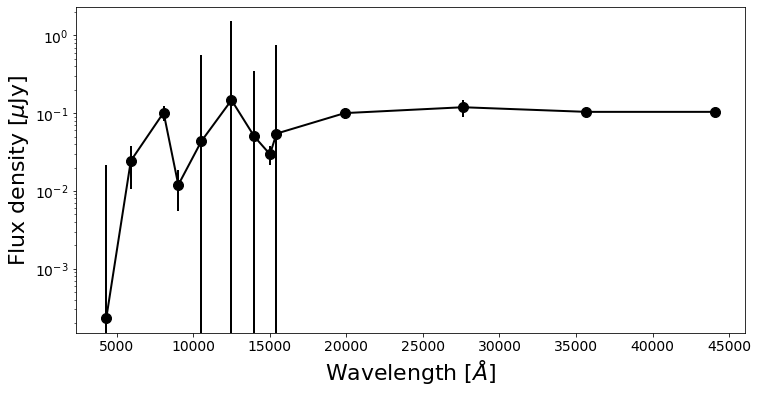

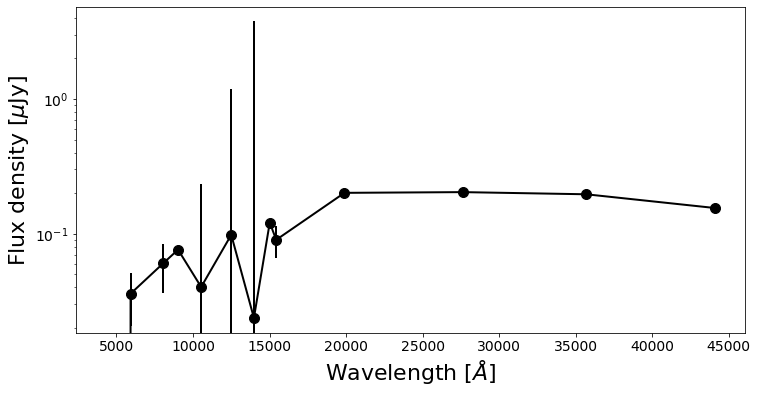

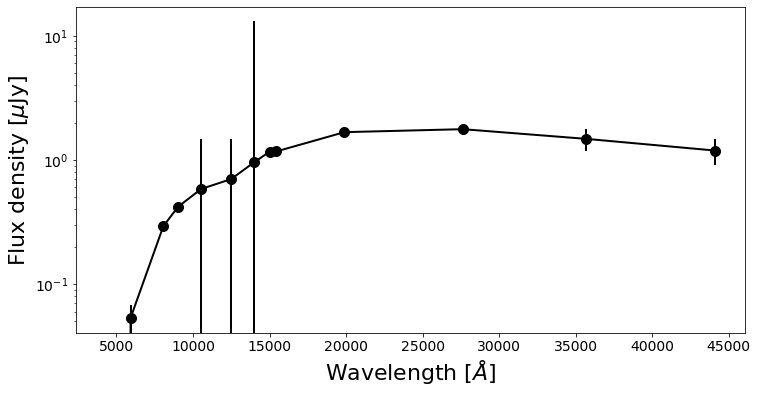

In [98]:
for ii in range(0,ngals):
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    f1.set_yscale('log')
    plt.xlabel(r"Wavelength [$\AA$]", fontsize=22)
    plt.ylabel(r"Flux density [$\mu$Jy]", fontsize=22)
    plt.setp(f1.get_yticklabels(), fontsize=14)
    plt.setp(f1.get_xticklabels(), fontsize=14)
    
    fluxes = np.zeros(nbands)
    flux_errors = np.zeros(nbands)
    for bb in range(0,nbands):
        fluxes[bb] = photo_cat['%s_flux_aper_3' % name_fil_sort[bb]][idx_sel[0][ii]]
        flux_errors[bb] = photo_cat['%s_fluxerr_aper_3' % name_fil_sort[bb]][idx_sel[0][ii]]
        
    plt.errorbar(photo_wave, fluxes, yerr=flux_errors, fmt='-o', markersize=10, lw=2, color='black')